In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, recall_score, f1_score, confusion_matrix

# Coursera Project
Course: IBM Machine Learning Series: Classification

by: Bashar Albaalbaki

Aug 2025

## 1. Problem Statement: Geothermal Heat Pumps On/Off Classification based on time and weather

Deeper than 5 m below ground surface, the earth's temperature is approximately independent of weather. So, in summer the ground is cooler than hot summer air and in winter the ground is warmer than cold winter air. And in a nutshell these two principles are the basis for geothermal heating and cooling. Not only geothermal heating and cooling can save the occupants on electricity cost but they are classified as a green energy source. See [here](https://igshpa.org/wp-content/uploads/LIFTOFF_DOE_Geothermal_HC.pdf) for more information.

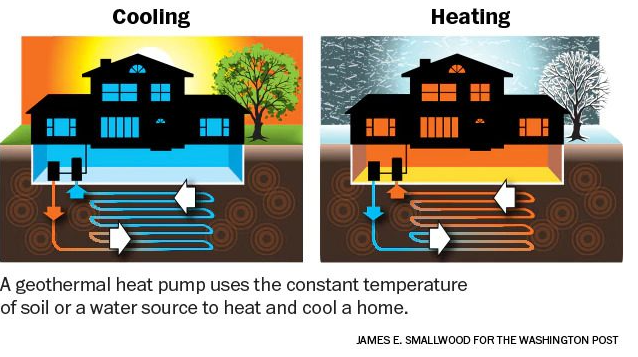

Source: https://www.whispervalleyaustin.com/geothermal-heat-pumps-are-among-the-most-earth-friendly-home-energy-sources-experts-say/

In this notebook we examine the heating and cooling modes of a geothermal heat pump for the Hugh Ashton building in Law & Buissiness school of De Montfort university in Leicester, UK. 

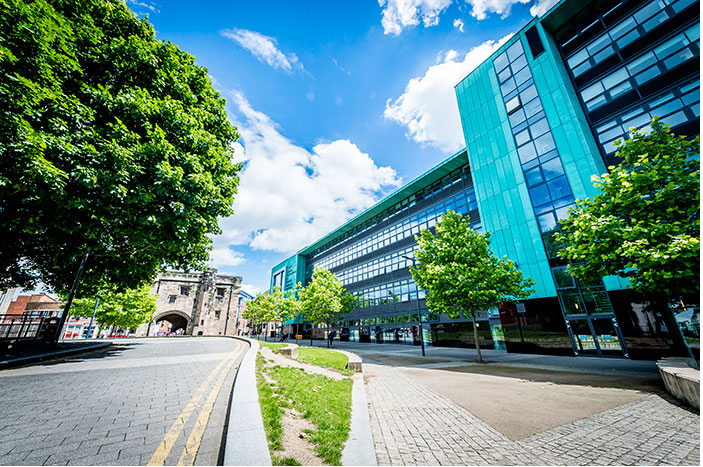

Source: https://www.dmu.ac.uk/about-dmu/estates-facilities/buildings-on-dmu-campus/hugh-aston-building.aspx

The data of the geothermal heat pumps were collected as part of a PhD thesis (Naicker 2015). See this [link](https://archive.researchdata.leeds.ac.uk/272/) for the data.

__Ref__: Naicker, S.S., 2015. Performance analysis of a large-scale ground source heat pump system (Doctoral dissertation, De Montfort University).

Specifically, we like to build a classifier to predict the on or off mode for heating and cooling mode of the heat pumps depending on time and weather. Time here means the combination of month, day of the week and hour of the day. For example we expect that in summer months usage will be different than rest of the year when university is in full occupancy, or we also expect to see lower usage in weekends unless it is near exam times of each semester. The weather data is the combination dry bulb temperature, relative humidity, perticipation amount and form, cloudiness and wind conditions. Finally note that for this system part of cooling is for the computer lab in the building. So, heating and cooling needs are not exclusive. For example, in winter months, many rooms in the building might need heating but the computer lab might need cooling.

Now, the De MontFort university database for the geothermal heat pumps consumption lists timestamp for each data collection, heating and cooling energy rates in kW and the measured temperature at the site. The collection is hourly from Feb 1st 2010 to Jul 31st 2012, in total about 21887 sets of data. 

To complement the data, I have used [Open Metro](https://open-meteo.com/), a weather API, that provides free weather history data for non-commercial use. Although we have to note that they don't have weather data for the building location but for a weather station about 16 km east of. 

Our goal here is both interpretation and prediction accuracy. We will build a logisitic regression classifier for interpretation, but for prediction we will select and optimize from five different classifiers:
1. Logistic Regression
2. Decision Tree
3. Random Forest
4. Support Vector Machine Classifiers
5. K-Nearest Neighbor Classifier

## 2. Cleaning Data and Feature/Label Extraction

For this notebook we start from csv file with the data collected from heat pumps in the building and wether data from the weather API combined. The attached python files show the steps for sending requests to the weather API and the programs to combine the data into a single csv; however, those details re not shown in thi notebook.  

In [51]:
df = pd.read_csv("project_data/data.csv")
cooling_kw = df["cooling_kw"]
heating_kw = df["heating_kw"]

In [52]:
df.shape

(21887, 17)

In [53]:
df.head()

,timestamp,cooling_kw,heating_kw,dmu_air_temperature_c,temperature_2m,relative_humidity_2m,precipitation,rain,showers,snowfall,snow_depth,dew_point_2m,wind_speed_10m,wind_direction_10m,wind_gusts_10m,cloud_cover,surface_pressure
0,2010-02-01 00:00:00,0.0,0.0,-0.60,-1.2,88.0,0.0,0.0,0.0,0.0,0.0,-2.9,17.4,277.0,28.4,13.0,999.8
1,2010-02-01 01:00:00,0.0,0.0,-0.22,-1.1,87.0,0.0,0.0,0.0,0.0,0.0,-3.0,18.6,285.0,29.9,28.0,1000.1
2,2010-02-01 02:00:00,0.0,0.0,0.27,-0.9,86.0,0.0,0.0,0.0,0.0,0.0,-2.9,18.5,291.0,30.6,15.0,1000.5
3,2010-02-01 03:00:00,0.0,0.0,-0.09,-0.7,85.0,0.0,0.0,0.0,0.0,0.0,-3.0,17.6,296.0,30.2,12.0,1000.9
4,2010-02-01 04:00:00,0.0,0.0,-0.19,-0.6,85.0,0.0,0.0,0.0,0.0,0.0,-2.8,16.3,301.0,30.2,6.0,1001.4


In [54]:
df.describe()

,cooling_kw,heating_kw,dmu_air_temperature_c,temperature_2m,relative_humidity_2m,precipitation,rain,showers,snowfall,snow_depth,dew_point_2m,wind_speed_10m,wind_direction_10m,wind_gusts_10m,cloud_cover,surface_pressure
count,21887.000000,21887.000000,21887.000000,21887.000000,21887.000000,21887.00000,21887.000000,21887.0,21887.000000,21887.000000,21887.000000,21887.000000,21887.000000,21887.000000,21887.000000,21887.000000
mean,2.630755,2.686263,9.335699,9.953817,79.694705,0.06513,0.062507,0.0,0.001941,0.001995,6.310463,15.896436,197.357655,30.281921,70.577649,1007.664367
std,8.792606,9.252040,12.458514,6.025226,13.970472,0.24635,0.240656,0.0,0.032134,0.009182,4.977605,7.601623,95.890012,13.840768,34.568062,10.709368
min,-99.000000,-99.000000,-99.000000,-8.700000,33.000000,0.00000,0.000000,0.0,0.000000,0.000000,-11.000000,0.000000,1.000000,2.200000,0.000000,959.800000
25%,1.000000,0.000000,6.035000,5.600000,71.000000,0.00000,0.000000,0.0,0.000000,0.000000,2.900000,10.100000,126.000000,19.800000,44.000000,1001.700000
50%,2.980000,2.430000,10.520000,10.300000,83.000000,0.00000,0.000000,0.0,0.000000,0.000000,6.800000,14.900000,220.000000,28.400000,89.000000,1008.200000
75%,4.740000,4.980000,14.600000,14.400000,91.000000,0.00000,0.000000,0.0,0.000000,0.000000,10.000000,20.600000,268.000000,38.900000,100.000000,1014.600000
max,73.748000,70.290000,28.660000,28.500000,100.000000,5.10000,5.100000,0.0,1.260000,0.080000,19.300000,51.200000,360.000000,97.900000,100.000000,1037.500000


Here the 2m in the feature names means that the measuements were taken 2 m above ground surface. The weather API can also provide measurements 10 m above ground but those were not used in here.

All the data except for the first three columns seems to have min and max values that make sense. 

However, we see the minimum value of -99 for cooling_kw, heating_kw and dmu_air_temperature_c which are not realistic values but rather in the collected data -99.0 represents sensor malfunction. Let's see how many of these -99 we have: 

In [55]:
print(f"number of faulty rows for cooling_kw: {np.sum(df['cooling_kw'].values < 0)}")
print(f"number of faulty rows for heating_kw: {np.sum(df['heating_kw'].values < 0)}")
print(f"number of faulty rows for dmu_air_temperature_c: {np.sum(df['dmu_air_temperature_c'].values < -98.9)}")

number of faulty rows for cooling_kw: 142
number of faulty rows for heating_kw: 142
number of faulty rows for dmu_air_temperature_c: 222


We see that the number of faulty rows for heating and cooling_kw are the same. Let's see if they are actually happen on the same rows:

In [56]:
print(f"number of faulty rows for cooling_kw: {np.sum((df['cooling_kw'].values < 0) & (df['heating_kw'].values < 0))}")

number of faulty rows for cooling_kw: 142


So indeed the faulty rows for cooling_kw are the same as faulty rows for heating_kw. Since these are target columns we remove rows with faulty values for these columns. 

In [57]:
df_cleaned = df[(df['cooling_kw'].values >= 0) & (df['heating_kw'].values >= 0)]
print(f"rows removed = {len(df) - len(df_cleaned)}")

rows removed = 142


To deal with faulty values in dmu_air_temperature_c we can completely replace that column with temperature_2m if they are correlated closely.

In [58]:
df_temporary = df_cleaned[df_cleaned["dmu_air_temperature_c"] > -20]
corr = df_temporary['dmu_air_temperature_c'].corr(df_temporary['temperature_2m'])
print(f"Correlation between dmu_air_temperature_c and temperature_2m = {corr}")

Correlation between dmu_air_temperature_c and temperature_2m = 0.9745633901658456


Since dmu_air_temperature_c and temperature_2m are closely correlated we safely remove dmu_air_temperature_c:

In [59]:
df_cleaned = df_cleaned.drop('dmu_air_temperature_c', axis = 1)

Let's also drop the "showers" columns as its min and max are zero:

In [60]:
df_cleaned = df_cleaned.drop('showers', axis = 1)

The consumption might be affected by hour of the day, day of the week and month of the year. So here the timestamp column is used to create these three new features 

In [61]:
timestamps = pd.to_datetime(df_cleaned['timestamp'])
df_cleaned['day_of_week'] = timestamps.dt.weekday  #or  day_name()
df_cleaned['day_of_week'].value_counts()

day_of_week
1    3144
0    3133
2    3100
4    3096
5    3096
6    3095
3    3081
Name: count, dtype: int64

In [62]:
df_cleaned['month'] = timestamps.dt.month # or month_name()
df_cleaned['month'].value_counts()

month
5     2232
7     2232
3     2220
6     2160
4     2152
2     1948
10    1488
12    1488
1     1488
8     1457
9     1440
11    1440
Name: count, dtype: int64

The less occurance of months Aug-Jan is explained by the time period of data collection which was from Feb-2010 to end of Jul-

In [63]:
df_cleaned['hour_of_day'] = timestamps.dt.hour
df_cleaned['hour_of_day'].value_counts()

hour_of_day
0     907
13    907
22    907
21    907
20    907
19    907
18    907
17    907
16    907
15    907
14    907
12    907
3     907
2     907
23    907
1     906
11    906
10    904
9     904
8     904
7     904
6     904
5     904
4     904
Name: count, dtype: int64

Looking again at description of numerical columns data:

In [64]:
df_cleaned.describe()

,cooling_kw,heating_kw,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,snow_depth,dew_point_2m,wind_speed_10m,wind_direction_10m,wind_gusts_10m,cloud_cover,surface_pressure,day_of_week,month,hour_of_day
count,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000,21745.000000
mean,3.294428,3.350298,9.976914,79.665992,0.064778,0.062189,0.001919,0.001990,6.327675,15.887786,197.211681,30.267165,70.497586,1007.783293,2.990159,6.143389,11.504852
std,3.149863,4.265198,6.023744,13.970011,0.246431,0.240843,0.031886,0.009201,4.978963,7.604454,95.878473,13.848921,34.588948,10.603352,2.002641,3.274431,6.923946
min,0.000000,0.000000,-8.700000,33.000000,0.000000,0.000000,0.000000,0.000000,-11.000000,0.000000,1.000000,2.200000,0.000000,959.800000,0.000000,1.000000,0.000000
25%,1.000000,0.000000,5.700000,71.000000,0.000000,0.000000,0.000000,0.000000,2.900000,10.100000,126.000000,19.800000,44.000000,1001.800000,1.000000,3.000000,6.000000
50%,2.980000,2.480000,10.300000,83.000000,0.000000,0.000000,0.000000,0.000000,6.800000,14.900000,220.000000,28.400000,89.000000,1008.300000,3.000000,6.000000,12.000000
75%,4.770000,4.980000,14.400000,91.000000,0.000000,0.000000,0.000000,0.000000,10.000000,20.600000,268.000000,38.900000,100.000000,1014.700000,5.000000,9.000000,18.000000
max,73.748000,70.290000,28.500000,100.000000,5.100000,5.100000,1.260000,0.080000,19.300000,51.200000,360.000000,97.900000,100.000000,1037.500000,6.000000,12.000000,23.000000


Now we are interested to categorize each of heating and cooling consumption into three groups: "off" which is for no usage , low which is usage lower than a threshold to be decided and finally "high" for values higher than the TBD threshold. To decide on what small values of usage to ignore as zero and also on the low-high boundary, now we will look at their histograms:

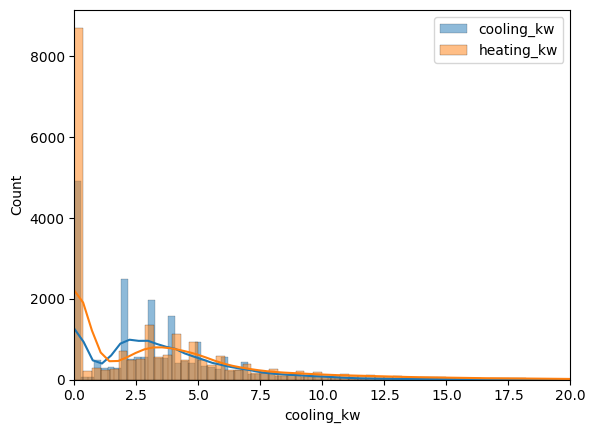

In [65]:
sns.histplot(df_cleaned["cooling_kw"], kde=True, edgecolor='black', label="cooling_kw")
sns.histplot(df_cleaned["heating_kw"], kde=True, edgecolor='black', label="heating_kw")
plt.xlim(0,20)
plt.legend()
plt.show()

In [66]:
df_cleaned['cooling_on_off'] = pd.cut(df_cleaned['cooling_kw'], bins=[-0.01, 1.0, 100.0], labels=[0,1], right=True)
df_cleaned['cooling_on_off'].value_counts()

cooling_on_off
1    16302
0     5443
Name: count, dtype: int64

In [67]:
df_cleaned['heating_on_off'] = pd.cut(df_cleaned['heating_kw'], bins=[-0.01, 1.0, 100.0], labels=[0,1], right=True)
df_cleaned['heating_on_off'].value_counts()

heating_on_off
1    12584
0     9161
Name: count, dtype: int64

Now, the input to the classification algo is generated:

<Axes: >

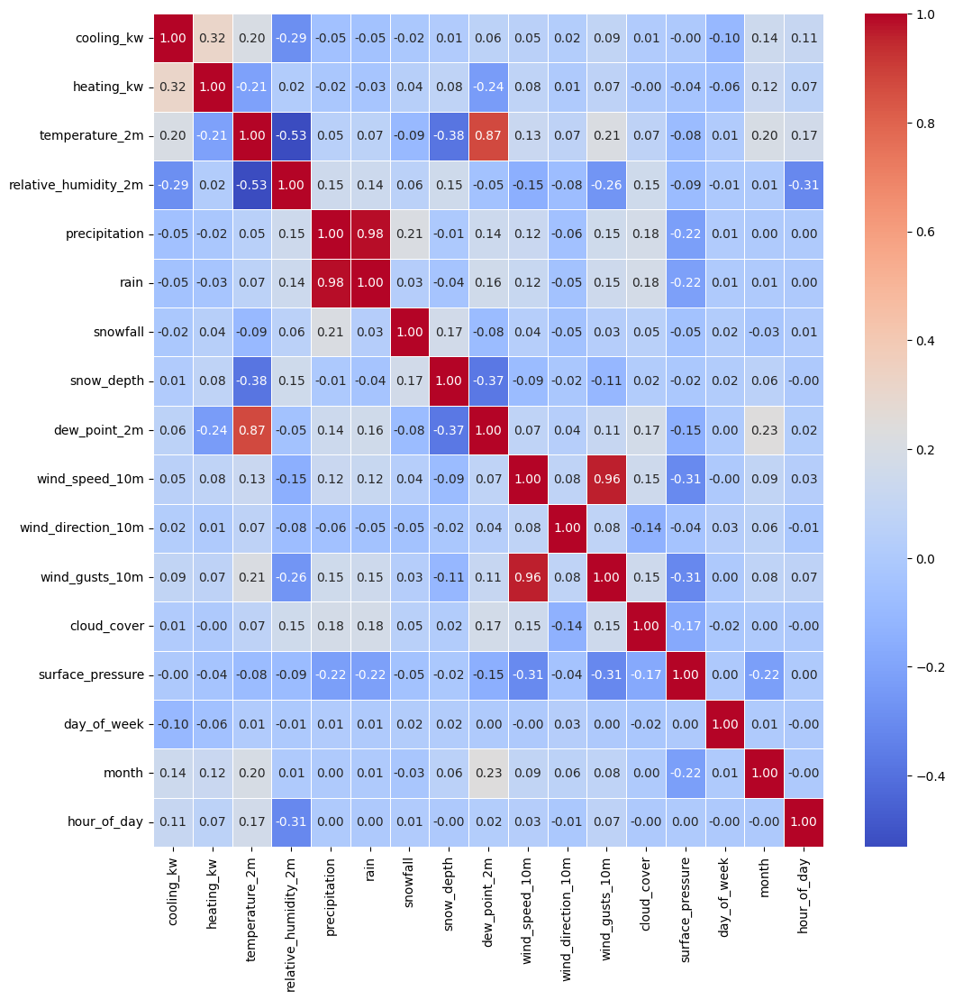

In [68]:
correlation_matrix = df_cleaned.drop(columns=['cooling_on_off','heating_on_off','timestamp']).corr()
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

From pairs of input features that are strongly correlated we would only keep one, so we will drop precipitation, dew_point_2m, wind_gusts_10m.

In [69]:
df_cleaned = df_cleaned.drop(columns=['precipitation','dew_point_2m','wind_gusts_10m'])

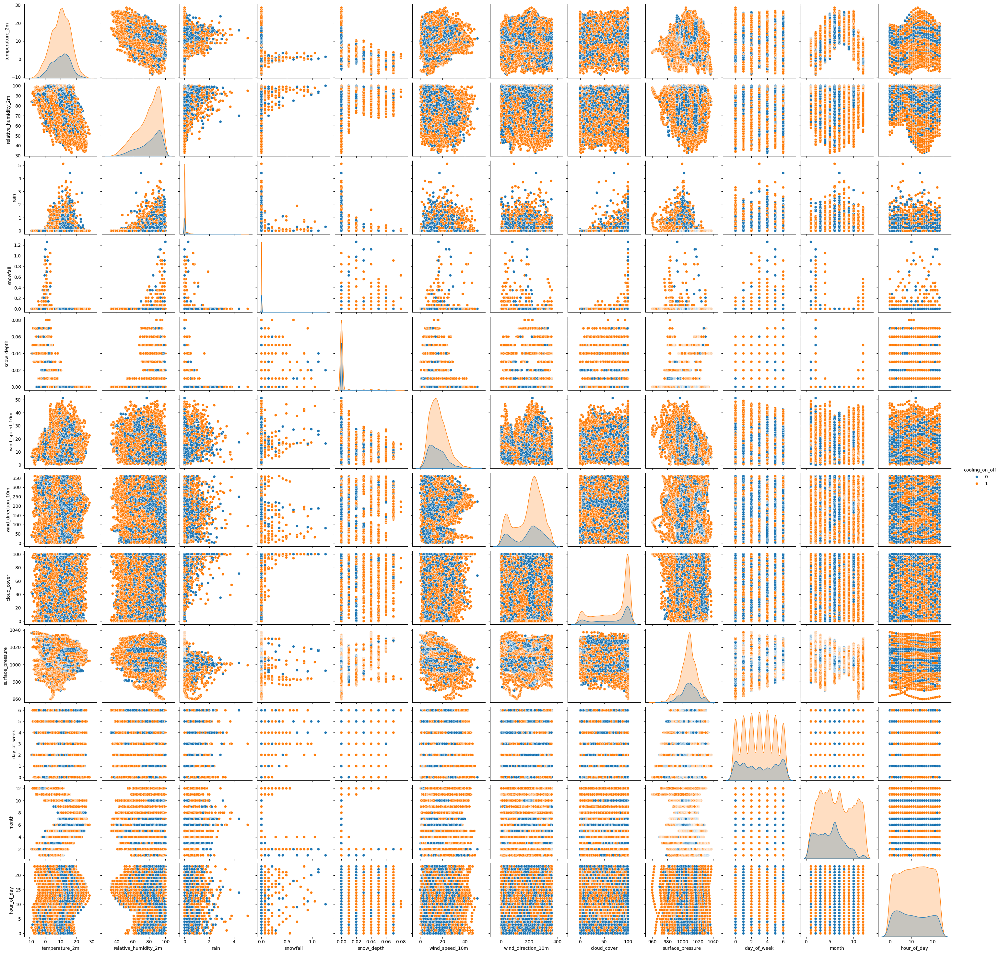

In [42]:
sns.pairplot(df_cleaned.drop(columns=['heating_on_off','timestamp','cooling_kw','heating_kw']) , hue="cooling_on_off")

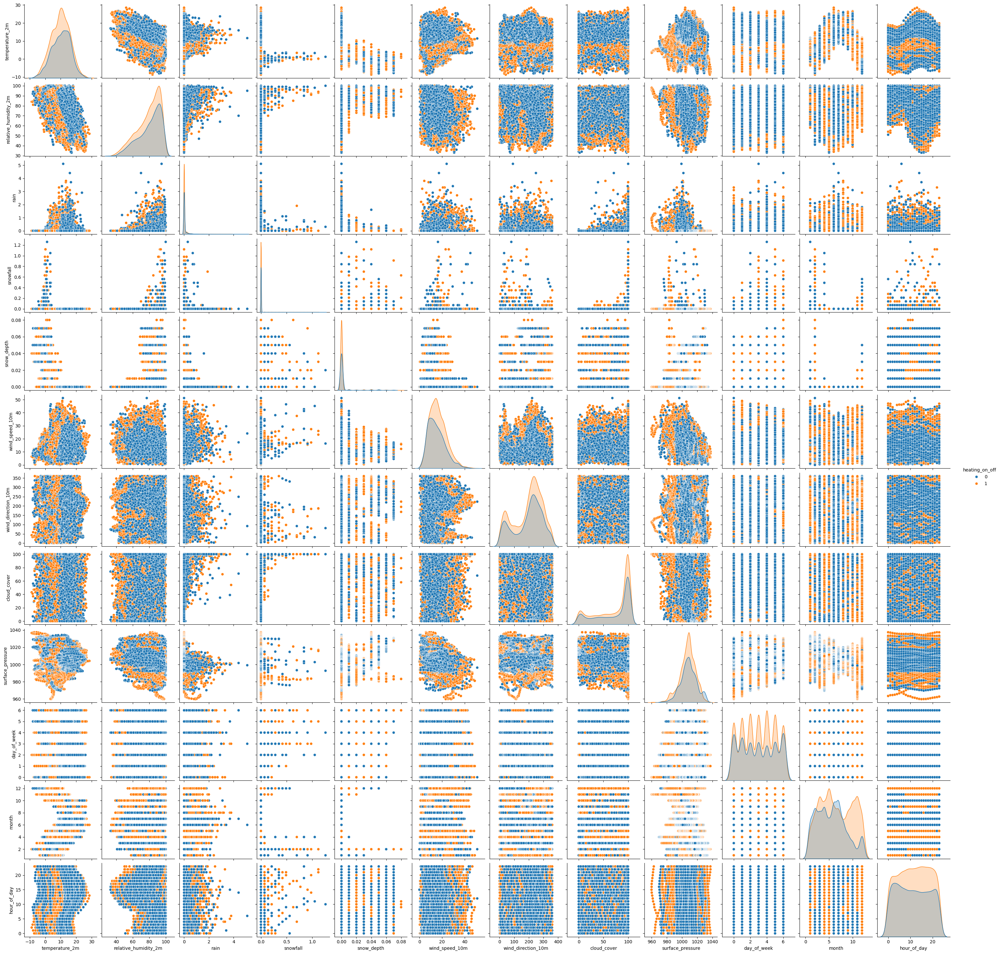

In [43]:
sns.pairplot(df_cleaned.drop(columns=['cooling_on_off','timestamp','cooling_kw','heating_kw']) , hue="heating_on_off")

In [73]:
X = df_cleaned.drop(columns=['cooling_kw','cooling_on_off','heating_kw','heating_on_off','timestamp'])
X.sample(25)

,temperature_2m,relative_humidity_2m,rain,snowfall,snow_depth,wind_speed_10m,wind_direction_10m,cloud_cover,surface_pressure,day_of_week,month,hour_of_day
14792,16.2,76.0,0.0,0.0,0.00,43.0,248.0,100.0,1005.5,0,10,9
13370,15.9,89.0,0.0,0.0,0.00,7.2,297.0,97.0,1002.5,4,8,3
2749,14.1,52.0,0.0,0.0,0.00,7.4,47.0,100.0,1003.7,2,5,14
3547,21.3,48.0,0.0,0.0,0.00,12.7,255.0,96.0,1011.7,0,6,20
3336,7.8,75.0,0.0,0.0,0.00,11.5,346.0,22.0,1012.5,6,6,1
10221,8.5,76.0,0.0,0.0,0.00,8.9,249.0,92.0,1004.7,5,4,22
4886,17.9,80.0,0.5,0.0,0.00,16.9,270.0,100.0,990.2,0,8,15
1914,8.3,64.0,0.0,0.0,0.00,2.6,34.0,34.0,1013.5,2,4,19
18205,11.5,78.0,0.0,0.0,0.00,12.3,238.0,100.0,1016.0,2,2,14
11661,14.2,78.0,0.0,0.0,0.00,9.4,272.0,81.0,1024.2,2,6,22


In [74]:
y = df_cleaned[['cooling_on_off' , 'heating_on_off']]
y.sample(25)

,cooling_on_off,heating_on_off
17169,1,1
13586,1,1
13137,1,0
16540,1,1
9223,1,1
3702,1,1
21218,0,0
3311,0,0
10788,0,0
13820,1,0


## 3. Train-Validation-Test Split and Scaling

The data is dvivided into three sets: Training, validaion and testing. The training data is used for scaling using the standard normal distribution and training the classification models.

In [75]:
X_train, XX, y_train, yy = train_test_split(X , y, random_state = 42, test_size = 0.2, stratify=y, shuffle=True)
X_val, X_test, y_val, y_test = train_test_split(XX , yy, random_state = 24, test_size = 0.5, stratify=yy, shuffle=True)

In [76]:
ss = StandardScaler()
X_train_scaled = ss.fit_transform(X_train)

Now, let's see how much we can compress data using principal component analysis:

In [77]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 0.95, svd_solver='full')
X_train_packed = pca.fit_transform(X_train_scaled)
print(f"Number of input features before packing: {X_train_scaled.shape[1]}")
print(f"Number of input features after packing by PCA: {X_train_packed.shape[1]}")

Number of input features before packing: 12
Number of input features after packing by PCA: 11


The compression by PCA only reduced one input feature. So, we will keep original uncompressed data.

We also use polynomial features to include interactions as well as second degree of features:

In [78]:
from sklearn.preprocessing import PolynomialFeatures
pf = PolynomialFeatures(degree=2)
X_train_2 = pf.fit_transform(X_train_scaled)

print(f"Number of input features originally: {X_train_scaled.shape[1]}")
print(f"Number of input features after polynomialization (degree 2): {X_train_2.shape[1]}")

Number of input features originally: 12
Number of input features after polynomialization (degree 2): 91


Just as an excercise we will try to compress the features using PCA:

In [79]:
X_train_packed = pca.fit_transform(X_train_2)
print(f"Number of input features after packing by PCA: {X_train_packed.shape[1]}")

Number of input features after packing by PCA: 20


One expect that PCA cancel out the polynomialization, but we can see after compression the original number of features is not recovered! So, we will apply PCA after polynomialization in here.

## 4. Classification part I: Select a Classifier Type

In this section we look at a few classification approaches by using the training set and try to get a intuition about effectiveness of each classification startegy and the effect of their parameters. First let import required modules and functions from sklearn and then build a pipeline to examine all different classifiers in the same manner.

Our criterion on comparing between different classifers and later optimizing the best ones is the F1 score.

In here also we build a helper function to train and report various classification scores. We will decide based on the F1 score to have a balanced precision and recall.

In [80]:
from sklearn.pipeline import Pipeline
def assess_classifier(clf, X_val, y_val) -> None:
    y_pred = clf.predict(X_val)
    print(f"Accuracey = {accuracy_score(y_pred.astype(float) , y_val.astype(float))}")
    print(f"Recall score = {recall_score(y_pred.astype(float) , y_val.astype(float))}")
    f1_score_value = f1_score(y_pred.astype(float) , y_val.astype(float))
    print(f"F1 score = {f1_score_value}")
    print(f"Confusion Matrix = \n{confusion_matrix(y_pred.astype(float) , y_val.astype(float))}")
    return f1_score_value

def train_assess_classifier(
    X_train:pd.DataFrame, 
    y_train:pd.DataFrame, 
    X_val:pd.DataFrame, 
    y_val:pd.DataFrame,
    clf:Pipeline,
) -> None:
    f1_avg = 0
    for label in ["cooling_on_off" , "heating_on_off"]:
        print(f"======= label = {label} =========================")
        clf.fit(X_val, y_val[label])
        f1_avg += 0.5 * assess_classifier(clf, X_test, y_test[label])
    print("==================================================")
    print(f"f1_Avg = {f1_avg}")

### 4.1 Logistic Classifier

As an exception, the helper function train_assess_classifier is not used in this case because we want to look at coefficients of the logistic regression for the interpretation as well as prediction.

In [81]:
from sklearn.linear_model import LogisticRegression
pipe_sc_clf = Pipeline([('scaler', StandardScaler()), ('lg', LogisticRegression(random_state=0))])
f1_avg = 0
interpretation = pd.DataFrame()
interpretation["features"] = X.columns.tolist() + ["intercept"]
for label in ["cooling_on_off" , "heating_on_off"]:
    print(f"======= label = {label} =========================")
    pipe_sc_clf.fit(X_train, y_train[label])
    f1_avg += 0.5 * assess_classifier(pipe_sc_clf, X_val, y_val[label])
    interpretation[label + " coeffs"] = np.concatenate([pipe_sc_clf['lg'].coef_.reshape(-1), pipe_sc_clf['lg'].intercept_])
print("==================================================")
print(f"f1_Avg = {f1_avg}")
interpretation

======= label = cooling_on_off =========================
Accuracey = 0.7470101195952162
Recall score = 0.7504638218923934
F1 score = 0.8547279450607501
Confusion Matrix = 
[[   6   12]
 [ 538 1618]]
======= label = heating_on_off =========================
Accuracey = 0.609935602575897
Recall score = 0.6244700181708056
F1 score = 0.7085910652920963
Confusion Matrix = 
[[ 295  228]
 [ 620 1031]]
f1_Avg = 0.7816595051764232


,features,cooling_on_off coeffs,heating_on_off coeffs
0,temperature_2m,-0.391982,-0.426907
1,relative_humidity_2m,-0.329927,-0.277257
2,rain,-0.076748,-0.024914
3,snowfall,-0.020909,0.021143
4,snow_depth,0.269039,-0.230988
5,wind_speed_10m,0.099211,0.102657
6,wind_direction_10m,0.051520,-0.011029
7,cloud_cover,0.123147,0.061203
8,surface_pressure,-0.097598,-0.070014
9,day_of_week,-0.015512,0.039247


We can see that the most important feature is the month number! So it might make sense in simple load modelling to just come up with 12 load profiles for the 12 months of the year. After month, the most important parameters in order of importance are: temperature, relative humidity, snow_depth.

In [82]:
pipe_sc_pf_pca_clf = Pipeline([
    ('scaler', StandardScaler()), 
    ('pf' , PolynomialFeatures(degree=2)),
    ('pca', PCA(n_components=0.95)),
    ('lg', LogisticRegression(random_state=0)),
])
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_pf_pca_clf)

======= label = cooling_on_off =========================
Accuracey = 0.751264367816092
Recall score = 0.756109022556391
F1 score = 0.8560787443469008
Confusion Matrix = 
[[  25   22]
 [ 519 1609]]
======= label = heating_on_off =========================
Accuracey = 0.585287356321839
Recall score = 0.5928050052137643
F1 score = 0.7159949622166247
Confusion Matrix = 
[[ 136  121]
 [ 781 1137]]
f1_Avg = 0.7860368532817628


Consideration of polyno,ial features did not result in significant improvement of F1 score.

### 4.2 Decision Tree

In [83]:
from sklearn.tree import DecisionTreeClassifier
pipe_sc_clf.steps[-1] = ('dt' , DecisionTreeClassifier(random_state=0))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_clf)

======= label = cooling_on_off =========================
Accuracey = 0.7245977011494252
Recall score = 0.8350649350649351
F1 score = 0.8111005991800694
Confusion Matrix = 
[[ 290  345]
 [ 254 1286]]
======= label = heating_on_off =========================
Accuracey = 0.6317241379310344
Recall score = 0.6896265560165975
F1 score = 0.6747868453105969
Confusion Matrix = 
[[543 427]
 [374 831]]
f1_Avg = 0.7429437222453331


In [84]:
pipe_sc_pf_pca_clf.steps[-1] = ('dt' , DecisionTreeClassifier(random_state=0))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_pf_pca_clf)

======= label = cooling_on_off =========================
Accuracey = 0.672183908045977
Recall score = 0.7847394540942928
F1 score = 0.7801418439716312
Confusion Matrix = 
[[ 197  366]
 [ 347 1265]]
======= label = heating_on_off =========================
Accuracey = 0.5944827586206897
Recall score = 0.6561461794019934
F1 score = 0.6417546709991877
Confusion Matrix = 
[[503 468]
 [414 790]]
f1_Avg = 0.7109482574854095


Decision tree classifier with or without polynomial features underperformed compared to logistic regression.

### 4.3 Random Forest

In [85]:
from sklearn.ensemble import RandomForestClassifier
pipe_sc_clf.steps[-1] = ('rf' , RandomForestClassifier(random_state=0, max_depth = 15))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_clf)

======= label = cooling_on_off =========================
Accuracey = 0.7954022988505747
Recall score = 0.8010152284263959
F1 score = 0.8764232157733963
Confusion Matrix = 
[[ 152   53]
 [ 392 1578]]
======= label = heating_on_off =========================
Accuracey = 0.7268965517241379
Recall score = 0.7402315484804631
F1 score = 0.775
Confusion Matrix = 
[[ 558  235]
 [ 359 1023]]
f1_Avg = 0.8257116078866982


In [86]:
pipe_sc_pf_pca_clf.steps[-1] = ('rf' , RandomForestClassifier(random_state=0, max_depth = 15))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_pf_pca_clf)

======= label = cooling_on_off =========================
Accuracey = 0.775632183908046
Recall score = 0.7813884785819794
F1 score = 0.8667394866193336
Confusion Matrix = 
[[ 100   44]
 [ 444 1587]]
======= label = heating_on_off =========================
Accuracey = 0.6648275862068965
Recall score = 0.687721788502484
F1 score = 0.7266591676040495
Confusion Matrix = 
[[477 289]
 [440 969]]
f1_Avg = 0.7966993271116916


Random forest without polynomial features so far is th best classifier in terms of F1 score.

### 4.4 Support Vector Machines

In [87]:
from sklearn.svm import SVC
pipe_sc_clf.steps[-1] = ('svc' , SVC(gamma='auto'))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_clf)

======= label = cooling_on_off =========================
Accuracey = 0.7485057471264368
Recall score = 0.7506938020351527
F1 score = 0.8557869760084366
Confusion Matrix = 
[[   5    8]
 [ 539 1623]]
======= label = heating_on_off =========================
Accuracey = 0.6496551724137931
Recall score = 0.6705639614855571
F1 score = 0.7190265486725663
Confusion Matrix = 
[[438 283]
 [479 975]]
f1_Avg = 0.7874067623405014


In [88]:
pipe_sc_pf_pca_clf.steps[-1] = ('svc' , SVC(gamma='auto'))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_pf_pca_clf)

======= label = cooling_on_off =========================
Accuracey = 0.7659770114942529
Recall score = 0.7679083094555874
F1 score = 0.8633557046979866
Confusion Matrix = 
[[  58   23]
 [ 486 1608]]
======= label = heating_on_off =========================
Accuracey = 0.6335632183908046
Recall score = 0.6374478234943352
F1 score = 0.7284497444633731
Confusion Matrix = 
[[ 309  189]
 [ 608 1069]]
f1_Avg = 0.7959027245806798


Still random forest seems to be the winner!

### 4.5 KNN Classifiers

In [89]:
from sklearn.neighbors import KNeighborsClassifier
pipe_sc_clf.steps[-1] = ('knnc' , KNeighborsClassifier(n_neighbors=3))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_clf)

======= label = cooling_on_off =========================
Accuracey = 0.7526436781609196
Recall score = 0.814985590778098
F1 score = 0.8401663695781343
Confusion Matrix = 
[[ 223  217]
 [ 321 1414]]
======= label = heating_on_off =========================
Accuracey = 0.6611494252873563
Recall score = 0.7069102462271644
F1 score = 0.7071911005164879
Confusion Matrix = 
[[548 368]
 [369 890]]
f1_Avg = 0.7736787350473111


In [90]:
pipe_sc_pf_pca_clf.steps[-1] = ('knnc' , KNeighborsClassifier(n_neighbors=3))
train_assess_classifier(X_train, y_train, X_val, y_val,pipe_sc_pf_pca_clf)

======= label = cooling_on_off =========================
Accuracey = 0.7406896551724138
Recall score = 0.8092753623188406
F1 score = 0.831942789034565
Confusion Matrix = 
[[ 215  235]
 [ 329 1396]]
======= label = heating_on_off =========================
Accuracey = 0.6372413793103449
Recall score = 0.6827747466874513
F1 score = 0.6894923258559622
Confusion Matrix = 
[[510 382]
 [407 876]]
f1_Avg = 0.7607175574452636


## 4. Classification part II: Refine the Selected Classifiers

From five different classifiers {Logistic Regression, Decision Tree, Random Forest, SVC, KNN}, random forest without polynomial features provided the best F1 score. For KNN I am not sure that 3 neighbors was the best choice, so KNN is also revisited and optimized. Here using cross validation from sklearn, the optimum number of depths for random forest and optimum number of neighbors will be investigated.

Because we will be doing cross validation, the validation set is added to the training data. 

In [91]:
from sklearn.model_selection import GridSearchCV
X_train_val = pd.concat([X_train, X_val], axis = 0)
y_train_val = pd.concat([y_train, y_val], axis = 0)

In [92]:
print("=============  Optimizing RF Cooling on/off ============================")
pipe_sc_clf.steps[-1] = ('rf' , RandomForestClassifier(random_state=0, max_depth = 15))
param_grid = {'rf__max_depth': np.arange(10,21)}
search_rf_cooling = GridSearchCV(pipe_sc_clf, param_grid, cv=5, verbose=4, scoring='f1')
search_rf_cooling.fit(X_train_val, y_train_val["cooling_on_off"])
print("\n\n=============  Optimizing RF Heating on/off ============================")
search_rf_heating = GridSearchCV(pipe_sc_clf, param_grid, cv=5, verbose=4, scoring='f1')
search_rf_heating.fit(X_train_val, y_train_val["heating_on_off"])
print("\n\n=============  Optimizing KNN Cooling on/off ============================")
pipe_sc_clf.steps[-1] = ('knnc' , KNeighborsClassifier(n_neighbors=3))
param_grid = {'knnc__n_neighbors': np.arange(3,11)}
search_knn_cooling = GridSearchCV(pipe_sc_clf, param_grid, cv=5, verbose=4, scoring='f1')
search_knn_cooling.fit(X_train_val, y_train_val["cooling_on_off"])
print("\n\n=============  Optimizing KNN Heating on/off ============================")
search_knn_heating = GridSearchCV(pipe_sc_clf, param_grid, cv=5, verbose=4, scoring='f1')
search_knn_heating.fit(X_train_val, y_train_val["heating_on_off"])

=============  Optimizing RF Cooling on/off ============================
Fitting 5 folds for each of 11 candidates, totalling 55 fits
[CV 1/5] END ..................rf__max_depth=10;, score=0.885 total time=   1.1s
[CV 2/5] END ..................rf__max_depth=10;, score=0.885 total time=   1.1s
[CV 3/5] END ..................rf__max_depth=10;, score=0.883 total time=   1.1s
[CV 4/5] END ..................rf__max_depth=10;, score=0.882 total time=   1.0s
[CV 5/5] END ..................rf__max_depth=10;, score=0.887 total time=   1.1s
[CV 1/5] END ..................rf__max_depth=11;, score=0.893 total time=   1.2s
[CV 2/5] END ..................rf__max_depth=11;, score=0.891 total time=   1.2s
[CV 3/5] END ..................rf__max_depth=11;, score=0.889 total time=   1.2s
[CV 4/5] END ..................rf__max_depth=11;, score=0.891 total time=   1.2s
[CV 5/5] END ..................rf__max_depth=11;, score=0.896 total time=   1.2s
[CV 1/5] END ..................rf__max_depth=12;, score=

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knnc',
                                        KNeighborsClassifier(n_neighbors=3))]),
             param_grid={'knnc__n_neighbors': array([ 3,  4,  5,  6,  7,  8,  9, 10])},
             scoring='f1', verbose=4)

In [93]:
print("===== Optimum RF, Cooling on/off ===============")
print(f"best parameter: {search_rf_cooling.best_params_}")
print(f"best_score: {search_rf_cooling.best_score_}")
print("===== Optimum RF, Heating on/off ===============")
print(f"best parameter: {search_rf_heating.best_params_}")
print(f"best_score: {search_rf_heating.best_score_}")
print("===== Optimum KNN, Cooling on/off ===============")
print(f"best parameter: {search_knn_cooling.best_params_}")
print(f"best_score: {search_knn_cooling.best_score_}")
print("===== Optimum KNN, Heating on/off ===============")
print(f"best parameter: {search_knn_heating.best_params_}")
print(f"best_score: {search_knn_heating.best_score_}")

===== Optimum RF, Cooling on/off ===============
best parameter: {'rf__max_depth': 20}
best_score: 0.9391498140797877
===== Optimum RF, Heating on/off ===============
best parameter: {'rf__max_depth': 20}
best_score: 0.9129105814393761
===== Optimum KNN, Cooling on/off ===============
best parameter: {'knnc__n_neighbors': 3}
best_score: 0.9323477022686223
===== Optimum KNN, Heating on/off ===============
best parameter: {'knnc__n_neighbors': 3}
best_score: 0.8872903832133282


We see a significant improvement to F1 score when cross validation is used. Both KNN and RF perform pretty well but RF is slightly higher on F1 score so it is selected as the ultimiate classifier here.

## 5. Classification part III: Using the test data for the first and last time!

Now, selecting random forest over KNN classifier for both heating and cooling, now we test the two RF classifiers again the unseen test data as the last step QA.

In [94]:
assess_classifier(search_rf_cooling, X_test, y_test["cooling_on_off"])

Accuracey = 0.9291954022988506
Recall score = 0.9188882586500283
F1 score = 0.9546258102533883
Confusion Matrix = 
[[ 401   11]
 [ 143 1620]]


0.9546258102533883

In [95]:
assess_classifier(search_rf_heating, X_test, y_test["cooling_on_off"])

Accuracey = 0.8055172413793104
Recall score = 0.9660493827160493
F1 score = 0.8554834301332422
Confusion Matrix = 
[[ 500  379]
 [  44 1252]]


0.8554834301332422

The overal F1 scores are accepatble and pretty good on unseen test data and so the RF will be used as a classifier.

## 6. Conclusions

In this notebook, we have tried to classify on and off modes of heating and cooling heat pumps for the geothermal heat pumps of Hugh Aston building in Leicester, UK. The data analyzed were collected for 2.5 years between Feb 2010 to Aug 2012. The weather data from a nearby weather station was added to the data. 

### Key findings:
1. Using principal component analysis, the original data with 12 features could not be compressed further only by one feature removal. This compression which was =not applied.
2. Adding polynomail features of degree 2 increased features to 91 and next by PCA number of features decreased to 16. However, the polynomialized features performed worst or the same than original 12 features in almost all classifiers tried here.
3. Five classifiers were tried: logistic regression, decision tree, random forest, support vector classifiers and K-nearest neighbors. Among these, random forest perfomed better than the rest in terms of the F1 score.
4. RF and KNN classifiers were optimized using grid search cross validation. For random forest, the optimum depth was 20, the max allowed in the optimization. For KNN the optimum number of neighbors found to be 3, the min allowed in the optimization.
5. Finally RF was selected over KNN. The optimized RF perfomed acceptable on the test data that was not part of any training, validation or optimization.
6. Although logistic regression was not selected at the end, but it was for interpretation by looking at its coefficient. the most important parameters in order of importance are: month number, temperature, relative humidity, snow_depth 

### Future Research
1. For heating_kw and cooling_kw, a regressor should be trained.
2. Autoencoders might provide better feature compression as PCA was not able to compress data other than just by one degree.
3. There is a chance of over-fitting because the KNN optimization selected the minimum number of neighbors and RF optimization selected maximum number of depth.